# Image registration

**Louis Martinez**

This notebook explores several image registration techniques. Image registration is the process of aligning images from different sources (MRI and CT scan in medical imaging, for example), or images generated by the same device but with different viewing angles. Applications of image registration can be found mainly in the medical field, for example, to compare several images of an organ, as well as in astrophotography, to increase SNR by superimposing several images of the same star/region of space. In addition, image registration has more accessible applications, such as the creation of panoramas (an option now available on most smartphones).

The sections below focus more on the uses of image registration than on the underlying theory. Consequently, the algorithms presented require image processing techniques (or signal processing techniques in general) which are not detailed here. By way of example, the RANSAC algorithm will be used by calling a Scikit-image function that has already implemented this functionality.

The general aim of this notebook is to provide an implementation of high-level image registration algorithms that can be reused in other contexts. In addition, the libraries used are not necessarily the most efficient for the tasks performed, but they provide a sufficiently good understanding of the algorithms presented.

## Imports and utility functions

In [36]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import seaborn as sns

from skimage.io import imread
from skimage.feature import SIFT, plot_matches, match_descriptors
from skimage.measure import ransac
from skimage.transform import AffineTransform, warp
from skimage.exposure import equalize_adapthist

plt.rcParams['figure.figsize'] = [9, 9]

### Channels misalignment

In [26]:
def shift_channel(im, channel, shift_row, shift_col):
    """
    Shifts an image color channel by shift_row and shift_col pixels
    This function allows only downward and rightward shifts

    Parameters
    ------
    im : array-like
        image for which you want to shift a color channel

    channel : string
        color channel to shift. The parameter can take the values r, g or b

    shift_row : positive int
        number of rows down which you want to shift the color channel

    shift_row : positive int
        number of columns to the right of which you want to shift the color channel

    Returns
    ------
    im : array-like
        image whose specified channel has been shifted
    """
    channels = {'r': 0, 'g': 1, 'b': 2}
    if channel not in channels:
        raise ValueError('The channel value must be r, g or b')
    
    ch_index = channels[channel]
    im[:,:,ch_index] = np.roll(im[:,:,ch_index], (shift_row, shift_col), axis=(0,1))
    im[:shift_row,:,ch_index] = 0
    im[:,:shift_col,ch_index] = 0
    return im


ch2idx = {'r':0, 'g':1, 'b':2}

## Feature based registration to realign color channels

In this section, we use features based registration to align the misaligned RGB channels of an image. More specifically, we aim to realign channels R and B with channel B.Moreover, we focus on applying a global transformation to the images to be aligned. In other words, we apply the same transformation (transformation matrix) to all pixels in the channels to be aligned. Other local transformation techniques enable images to be repositioned more finely. However, as this section deals with simple deformations, a global model will suffice to provide satisfactory results.


To do so, we apply the following steps:  
1. Extract features on each image channel (keypoints and descriptors)
2. a) Match R channel keypoints with those on channel G
2. b) Match B channel keypoints with those on channel G
3. Determine affine transformations to align channels R and B with channel G
4. Apply these transformations to channels R and B
5. Re-stack RGB channels

### Pre-processing

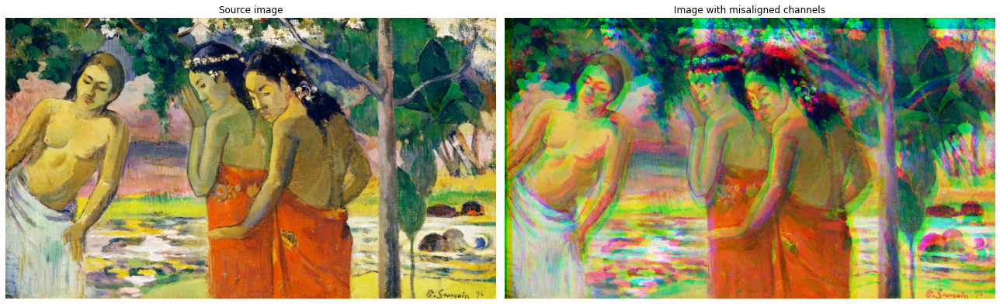

In [28]:
img_url = 'https://raw.githubusercontent.com/lmartinez2001/Resources/main/res/images/style-images/tahiti_guaguin.jpg'
im_src = imread(img_url).astype(np.float64)
im_src /= 255

im = im_src.copy()
im = shift_channel(im, 'r', 27, 5)
im = shift_channel(im, 'b', 3, 18)

fig, ax = plt.subplots(1,2, figsize=(18,7))
ax[0].imshow(im_src)
ax[0].set_title('Source image')
ax[0].axis('off')

ax[1].imshow(im)
ax[1].set_title('Image with misaligned channels')
ax[1].axis('off')
plt.tight_layout()
plt.show()

### Features extraction

There are several methods for feature extraction (SIFT, ORB, etc.). The main difference between these techniques is the tradeoff between algorithm speed and descriptor quality. Among the 2 previously mentioned methods, SIFT is the slowest but produces the best results in most image warping scenarios, while ORB is the fastest algorithm but delivers relatively poor results. ORB outperforms SIFT in very special scenarios such as 90° proportional rotations ([source](https://arxiv.org/ftp/arxiv/papers/1710/1710.02726.pdf#:~:text=We%20showed%20that%20ORB%20is,SIFT%20show%20almost%20similar%20performances.)).

As the issue at stake in this section is not computational performance but explicability, we have chosen to use the SIFT descriptors.

**Important note**  
The RGB channels in the source image have neither the same intensity nor the same contrast. Extracting features from the raw channels would lead to poor results when matching keypoints. In particular, the SIFT algorithm is designed not to consider areas of low contrast. It discards keypoints that might otherwise have been generated in these areas. To prevent these problems, we apply adaptive histogram equalization (CLAHE algorithm).

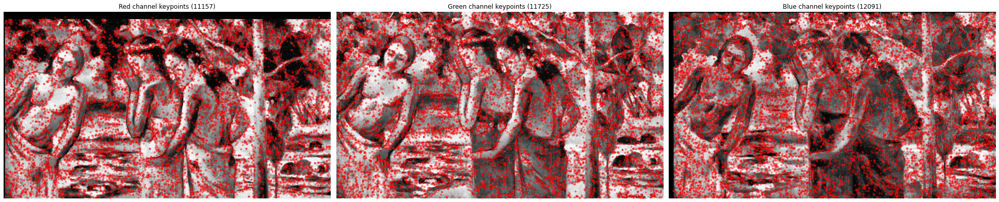

In [30]:
sift_extractor = SIFT()
im_channels = [im[:,:,i] for i in range(3)]
im_channels_equalized = [equalize_adapthist(im_channels[i]) for i in range(3)]

def extract_features(im):
    sift_extractor.detect_and_extract(im)
    kpts = sift_extractor.keypoints
    desc = sift_extractor.descriptors
    return {'keypoints':kpts, 'descriptors':desc}


channels_features = [extract_features(im_channels_equalized[i]) for i in range(3)]

fig, ax = plt.subplots(1, 3, figsize=(27,7))
for i, color in enumerate(['Red', 'Green', 'Blue']):
    ax[i].imshow(im_channels_equalized[i], cmap='gray')
    ax[i].axis('off')
    ax[i].set_title(f'{color} channel keypoints ({channels_features[i]["keypoints"].shape[0]})')
    ax[i].scatter(channels_features[i]['keypoints'][:,1], channels_features[i]['keypoints'][:,0], c='red', alpha=0.4, marker='.')
plt.tight_layout()

### Match keypoints

In this section, we want to match the R and B channel descriptors with the G channel descriptors. Skimage's `match_descriptors` function simply searches for the nearest G channel descriptor for each descriptor in one of the channels (R or B). The `cross_check` parameter enables the operation to be performed in the other direction (from G to R and B), so that only pairs that match in both directions are kept. The `max_ratios` parameter eliminates ambiguous matches.

C:\Users\Louis\AppData\Local\Temp\ipykernel_18796\2651158047.py:19: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  plot_matches(


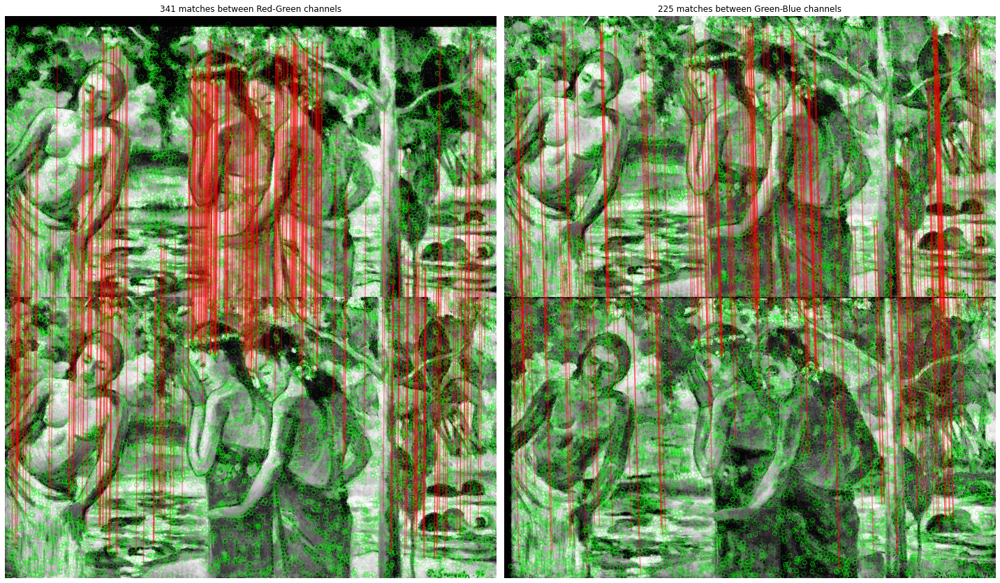

In [31]:
matches_rg = match_descriptors(
    channels_features[ch2idx['r']]['descriptors'], 
    channels_features[ch2idx['g']]['descriptors'],
    cross_check=True,
    max_ratio=0.4)

matches_gb = match_descriptors(
    channels_features[ch2idx['g']]['descriptors'], 
    channels_features[ch2idx['b']]['descriptors'],
    cross_check=True,
    max_ratio=0.6)

fig, ax = plt.subplots(1, 2, figsize=(20, 20))
for i, (colors, matches) in enumerate([('Red-Green', matches_rg), ('Green-Blue', matches_gb)]):
    im1 = im_channels_equalized[i]
    im2 = im_channels_equalized[i+1]
    kpts1 = channels_features[i]['keypoints']
    kpts2 = channels_features[i+1]['keypoints']
    plot_matches(
        ax[i], 
        im1, 
        im2, 
        kpts1, 
        kpts2, 
        matches,
        alignment='vertical',
        only_matches=False, 
        matches_color=[1.,0.,0.,.4], 
        keypoints_color=[0.,1.,0.,.3])
    ax[i].set_title(f'{matches.shape[0]} matches between {colors} channels')
    ax[i].axis('off')
plt.tight_layout()


### Determine affine transformations for the R-G and B-G channels couples

To estimate the parameters of the affine transformation that aligns channels R and B with channel G, we can use all the keypoint pairs determined previously. However, some of these pairs may be outliers and skew the parameter estimates. To make the model more robust, we use the RANSAC (RANdom SAmple Consensus) algorithm. This iterative algorithm estimates model parameters by eliminating outliers (theoretical details are not developed here).


**Important note**  
Since we're dealing here with a global transformation of the image, trying to model it using an affine transformation is often a good starting point. If the approximation is unsatisfactory, consider using a homography (or projective transformation) which has 8 degrees of freedom (2 rotations, 2 translations, 2 shears, 2 projections), whereas an affine transformation has only 6 (2 rotations, 2 translations, 2 shears).


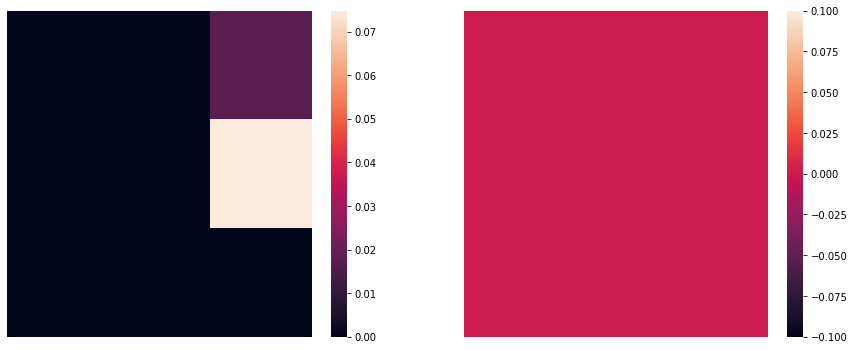

In [49]:
kpts_red = channels_features[ch2idx['r']]['keypoints']
kpts_green = channels_features[ch2idx['g']]['keypoints']
kpts_blue = channels_features[ch2idx['b']]['keypoints']

# handle red-green matching
src = kpts_red[matches_rg[:,0]][:,::-1]
dest = kpts_green[matches_rg[:,1]][:,::-1]

model_rg_naive = AffineTransform()
model_rg_naive.estimate(src, dest)

model_rg, inliers_rg = ransac(
                            (src, dest), 
                            AffineTransform,
                            min_samples=8,
                            residual_threshold=0.2,
                            max_trials=300)

# handle green-blue matching
src = kpts_blue[matches_gb[:,1]][:,::-1]
dest = kpts_green[matches_gb[:,0]][:,::-1]

model_gb_naive = AffineTransform()
model_gb_naive.estimate(src, dest)

model_gb, inliers_gb = ransac(
                            (src, dest), 
                            AffineTransform,
                            min_samples=4,
                            residual_threshold=20,
                            max_trials=400)


fig, ax = plt.subplots(1, 2, figsize=(15, 6))
ax[0].axis('off')
sns.heatmap(np.abs(model_rg_naive.params - model_rg.params), ax=ax[0])
ax[1].axis('off')
sns.heatmap(np.abs(model_gb_naive.params - model_gb.params), ax=ax[1])
plt.show()

C:\Users\Louis\AppData\Local\Temp\ipykernel_18796\589880747.py:9: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  plot_matches(


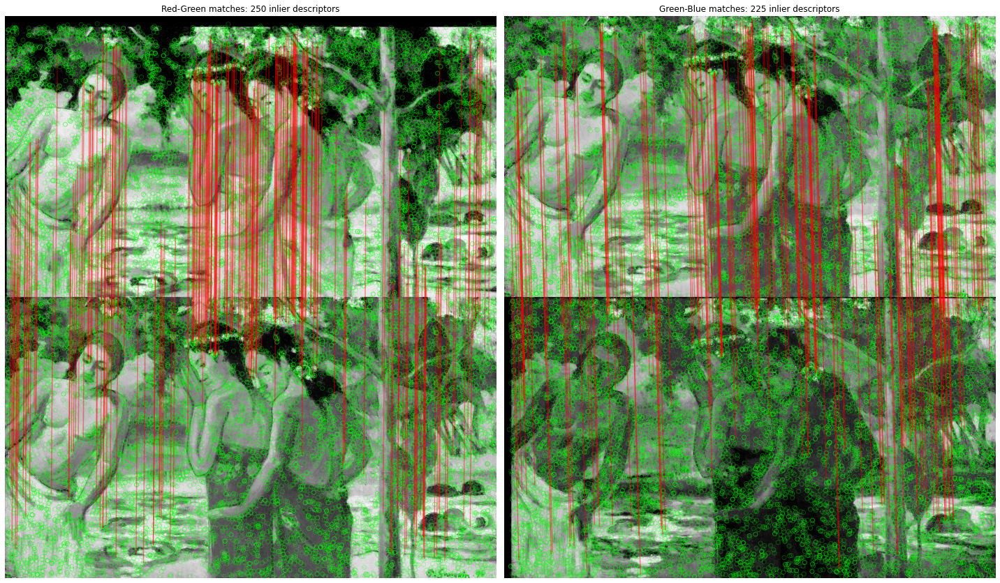

In [18]:
fig, ax = plt.subplots(1, 2, figsize=(20, 20))
for i, (colors, matches, inliers) in enumerate([('Red-Green', matches_rg, inliers_rg), ('Green-Blue', matches_gb, inliers_gb)]):
    ax[i].axis('off')
    ax[i].set_title(f'{colors} matches: {inliers.sum()} inlier descriptors')
    im1 = im_channels[i]
    im2 = im_channels[i+1]
    kpts1 = channels_features[i]['keypoints']
    kpts2 = channels_features[i+1]['keypoints']
    plot_matches(
        ax[i], 
        im1, 
        im2, 
        kpts1, 
        kpts2, 
        matches[inliers],
        alignment='vertical',
        matches_color=[1.,0.,0.,.4], 
        keypoints_color=[0.,1.,0.,.3])
plt.tight_layout()

### Apply global transformations to R and B channels

In [32]:
r_aligned = warp(im_channels[ch2idx['r']], model_rg.inverse)
r_aligned = (255 * r_aligned).astype(np.uint8)
b_aligned = warp(im_channels[ch2idx['b']], model_gb.inverse)
b_aligned = (255 * b_aligned).astype(np.uint8)

### Stack aligned RGB channels

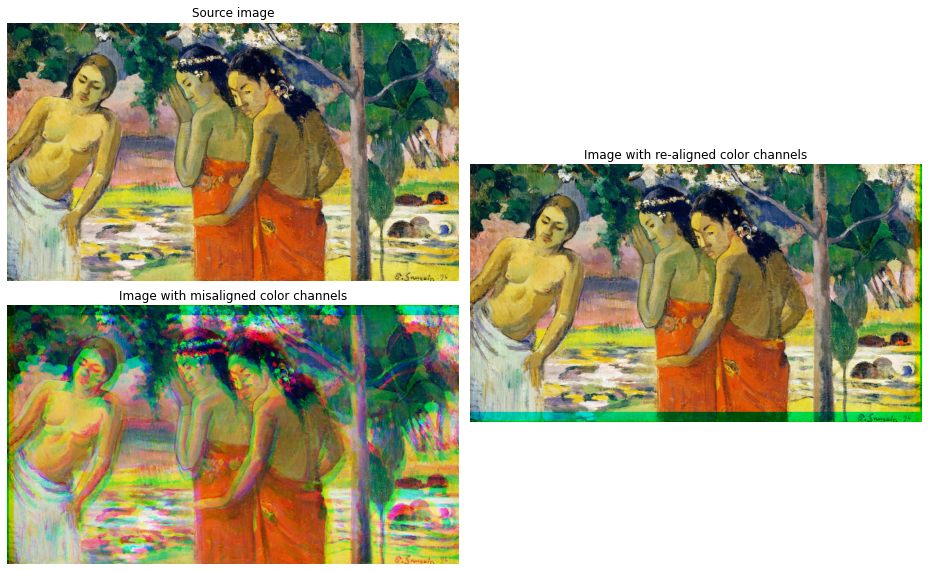

In [33]:

im_aligned = np.stack([r_aligned, (255 * im_channels[ch2idx['g']]).astype(np.uint8), b_aligned], axis=2)

fig, ax = plt.subplot_mosaic(
    '''
    AA..
    AACC
    BBCC
    BB..
    ''',
    figsize=(13,8))
ax['A'].imshow(im_src)
ax['A'].set_title('Source image')
ax['A'].axis('off')
ax['B'].imshow(im)
ax['B'].set_title('Image with misaligned color channels')
ax['B'].axis('off')
ax['C'].imshow(im_aligned)
ax['C'].set_title('Image with re-aligned color channels')
ax['C'].axis('off')
plt.tight_layout()
plt.show()